# Twenty horizontal BM4 recurrence trajectories: visualization

This notebook is the presentation-only half of the horizontal recurrence study. It loads `results.npz`, reconstructs the validated dense parallel result, and produces every audit, table, figure, conclusion, and animation without running a BM4 integrator.

In [1]:
from dataclasses import replace
from pathlib import Path
from types import SimpleNamespace

from IPython.display import Markdown, display
import matplotlib.pyplot as plt
import numpy as np

from diagnostics import load_parallel_bm4_recurrence_npz
from diagnostics.paths import find_project_root
from potential import load_gc2d_h5_potential
from studies.bm4_parallel_recurrence import ParallelBM4RecurrenceResult
from visualization import (
    animate_parallel_bm4_trajectories,
    display_animation,
    display_records_table,
    plot_parallel_bm4_recurrence_stack,
)

plt.rcParams.update({"figure.dpi": 110, "axes.grid": True})

## Load the persisted calculation

The NPZ archive is the boundary between computation and presentation. It retains all 20 saved states per cycle and the worker summaries. The exact integer-cycle samples are extracted separately for recurrence analysis because recurrence is defined only at cycle boundaries.

In [2]:
project_root = find_project_root(Path.cwd())
notebook_directory = (
    project_root
    / "notebooks/developements/recurrences/study_20_horizontal_bm4_recurrences"
)
results_path = notebook_directory / "results.npz"
stored = load_parallel_bm4_recurrence_npz(results_path)
result = stored.result
experiment_metadata = stored.metadata["experiment"]
potential_specification = experiment_metadata["potential"]

data_path = project_root / potential_specification["source_path"]
potential = load_gc2d_h5_potential(
    data_path,
    B=float(potential_specification["magnetic_field"]),
    characteristic_length=float(potential_specification["characteristic_length"]),
    indx=tuple(potential_specification["mode_selection"]),
    interpolation_order=int(potential_specification["interpolation_order"]),
)

config = result.config
particle_count = config.particle_count
saved_samples_per_cycle = config.saved_samples_per_cycle
assert particle_count == 20
assert saved_samples_per_cycle == 20
assert config.cycle_count == 50
assert config.output_sample_count == 1_001
assert result.positions.shape == (particle_count, 2, config.output_sample_count)
np.testing.assert_allclose(np.diff(result.times), 1.0 / saved_samples_per_cycle)

initial_x = result.initial_positions[:, 0]
initial_y = result.initial_positions[:, 1]
cycle_numbers = np.arange(config.cycle_count + 1, dtype=int)
cycle_boundary_indices = cycle_numbers * saved_samples_per_cycle
cycle_boundary_times = result.times[cycle_boundary_indices]
np.testing.assert_allclose(cycle_boundary_times, cycle_numbers.astype(float))

cycle_boundary_config = replace(config, saved_samples_per_cycle=1, progress=False)
cycle_boundary_result = ParallelBM4RecurrenceResult(
    config=cycle_boundary_config,
    times=cycle_boundary_times,
    initial_positions=result.initial_positions,
    positions=result.positions[:, :, cycle_boundary_indices],
    runtime_seconds=result.runtime_seconds,
    total_newton_iterations=result.total_newton_iterations,
    mean_newton_iterations=result.mean_newton_iterations,
    maximum_newton_iterations=result.maximum_newton_iterations,
    maximum_residual_to_tolerance=result.maximum_residual_to_tolerance,
    wall_runtime_seconds=result.wall_runtime_seconds,
)

cell_period = float(potential.grid.period)
recurrence_tolerance_fraction = float(
    experiment_metadata["recurrence_tolerance_fraction"]
)
recurrence_tolerance = recurrence_tolerance_fraction * cell_period
cycle_distances = cycle_boundary_result.recurrence_distances(period=cell_period)
nearest_cycle_indices = np.argmin(cycle_distances[:, 1:], axis=1) + 1
close_cycle_mask = cycle_distances[:, 1:] <= recurrence_tolerance
close_cycle_counts = np.sum(close_cycle_mask, axis=1)

best_particle, best_later_offset = np.unravel_index(
    np.argmin(cycle_distances[:, 1:]),
    cycle_distances[:, 1:].shape,
)
best_cycle_index = int(best_later_offset + 1)
best_cycle = int(cycle_numbers[best_cycle_index])
close_particle_count = int(np.count_nonzero(np.any(close_cycle_mask, axis=1)))

display(Markdown(
    f"Loaded **{results_path.relative_to(project_root)}** "
    f"({results_path.stat().st_size / 1024**2:.2f} MiB): "
    f"**{particle_count} trajectories**, **{result.times.size} saved states each**, "
    f"and **{saved_samples_per_cycle} states per cycle**. No integration was executed."
))

Loaded **notebooks/developements/recurrences/study_20_horizontal_bm4_recurrences/results.npz** (0.29 MiB): **20 trajectories**, **1001 saved states each**, and **20 states per cycle**. No integration was executed.

## Initial-condition coverage

The 20 initial points are equally spaced along the horizontal line through the periodic-cell centre. Trajectory 1 lies exactly at the centre, and trajectory 20 is the last half-open sample before the right boundary.

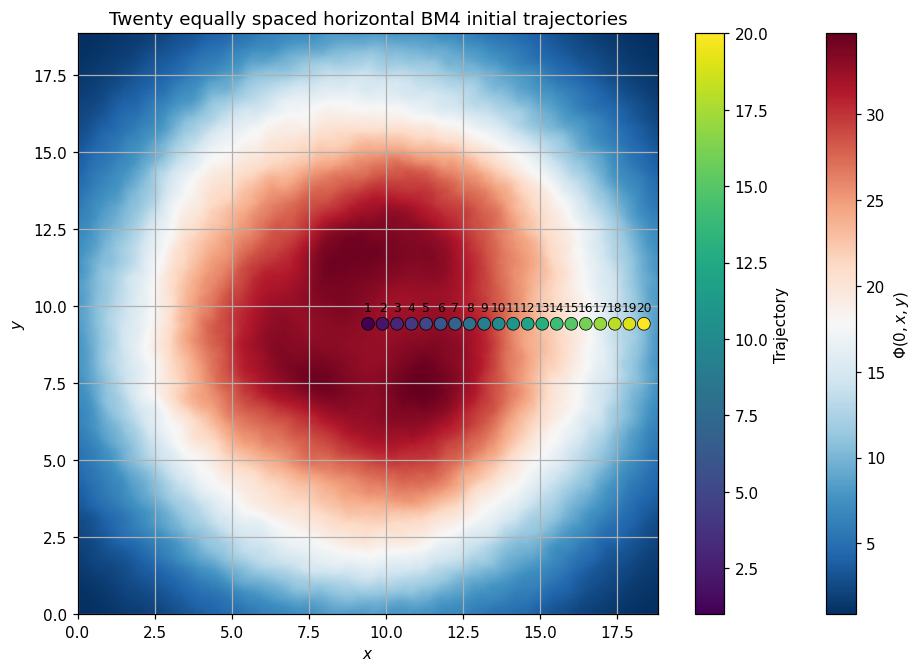

In [3]:
grid = potential.grid
field_at_zero = np.asarray(potential.evaluate_grid(0.0), dtype=float)
figure, axis = plt.subplots(figsize=(9, 6), constrained_layout=True)
image = axis.imshow(
    field_at_zero.T,
    origin="lower",
    extent=(grid.xmin, grid.xmin + grid.period, grid.ymin, grid.ymin + grid.period),
    cmap="RdBu_r",
    aspect="equal",
)
points = axis.scatter(
    initial_x,
    initial_y,
    c=np.arange(1, particle_count + 1),
    cmap="viridis",
    s=70,
    edgecolor="black",
    linewidth=0.5,
    zorder=3,
)
for trajectory, (x_value, y_value) in enumerate(zip(initial_x, initial_y, strict=True), start=1):
    axis.annotate(
        str(trajectory),
        (x_value, y_value),
        xytext=(0, 8),
        textcoords="offset points",
        ha="center",
        fontsize=8,
    )
axis.set(
    title="Twenty equally spaced horizontal BM4 initial trajectories",
    xlabel="$x$",
    ylabel="$y$",
)
figure.colorbar(image, ax=axis, label=r"$\Phi(0,x,y)$")
figure.colorbar(points, ax=axis, label="Trajectory")
plt.show()

## Twenty vertically stacked recurrence plots

Recurrence is measured only at the 51 exact integer-cycle boundaries extracted from the dense history. Each panel omits cycle zero and uses a logarithmic vertical scale. The dashed line is the close-return threshold, and the red point marks the closest later cycle.

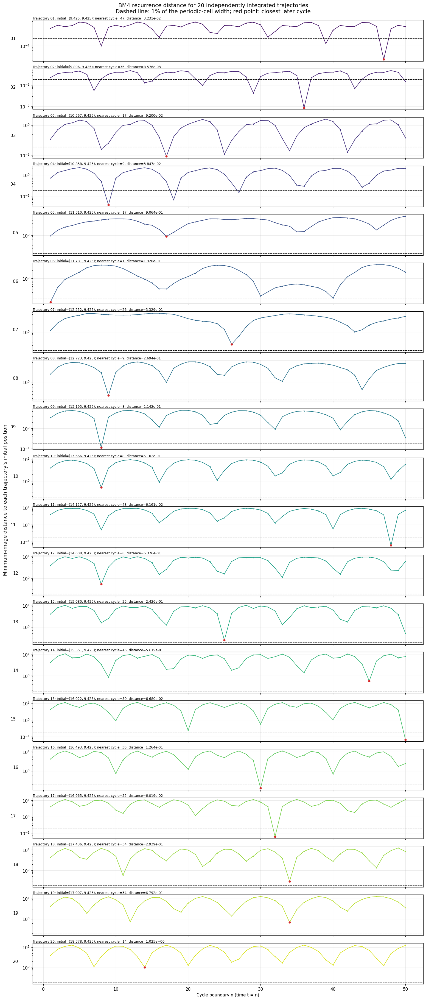

In [4]:
recurrence_figure, recurrence_axes = plot_parallel_bm4_recurrence_stack(
    cycle_boundary_result,
    period=cell_period,
    recurrence_tolerance_fraction=recurrence_tolerance_fraction,
)
assert recurrence_axes.shape == (particle_count,)
plt.show()

## Closest return for every trajectory

In [5]:
nearest_rows = []
for particle in range(particle_count):
    nearest_index = int(nearest_cycle_indices[particle])
    nearest_rows.append(SimpleNamespace(
        trajectory=particle + 1,
        initial_x=initial_x[particle],
        initial_y=initial_y[particle],
        nearest_cycle=int(cycle_numbers[nearest_index]),
        nearest_distance=cycle_distances[particle, nearest_index],
        cell_fraction=cycle_distances[particle, nearest_index] / cell_period,
        close_return_count=int(close_cycle_counts[particle]),
    ))
display_records_table(
    tuple(nearest_rows),
    columns=(
        ("trajectory", "Trajectory", "d"),
        ("initial_x", "Initial x", ".6f"),
        ("initial_y", "Initial y", ".6f"),
        ("nearest_cycle", "Cycle", "d"),
        ("nearest_distance", "Distance", ".5e"),
        ("cell_fraction", "Cell-width fraction", ".5e"),
        ("close_return_count", "Cycles within threshold", "d"),
    ),
)

Trajectory,Initial x,Initial y,Cycle,Distance,Cell-width fraction,Cycles within threshold
1,9.424778,9.424778,47,3.23058e-02,1.71388e-03,3
2,9.896017,9.424778,36,8.57576e-03,4.54958e-04,8
3,10.367256,9.424778,17,9.20022e-02,4.88087e-03,5
4,10.838495,9.424778,9,3.84742e-02,2.04112e-03,3
5,11.309734,9.424778,17,9.06436e-01,4.80879e-02,0
6,11.780972,9.424778,1,1.31977e-01,7.00159e-03,2
7,12.252211,9.424778,26,3.32868e-01,1.76592e-02,0
8,12.723450,9.424778,9,2.69440e-01,1.42942e-02,0
9,13.194689,9.424778,8,1.14226e-01,6.05990e-03,1
10,13.665928,9.424778,8,5.10187e-01,2.70662e-02,0


## Per-trajectory runtime and Newton work

In [6]:
work_rows = tuple(
    SimpleNamespace(
        trajectory=particle + 1,
        runtime=result.runtime_seconds[particle],
        mean_iterations=result.mean_newton_iterations[particle],
        maximum_iterations=result.maximum_newton_iterations[particle],
        total_iterations=result.total_newton_iterations[particle],
        maximum_residual_ratio=result.maximum_residual_to_tolerance[particle],
    )
    for particle in range(particle_count)
)
display_records_table(
    work_rows,
    columns=(
        ("trajectory", "Trajectory", "d"),
        ("runtime", "Runtime [s]", ".3f"),
        ("mean_iterations", "Mean corrections/step", ".3f"),
        ("maximum_iterations", "Max corrections/step", "d"),
        ("total_iterations", "Total corrections", "d"),
        ("maximum_residual_ratio", "Max residual/tolerance", ".3e"),
    ),
)

Trajectory,Runtime [s],Mean corrections/step,Max corrections/step,Total corrections,Max residual/tolerance
1,673.458,0.096,1,382,9.986e-01
2,647.766,0.092,1,369,9.997e-01
3,705.687,0.143,1,574,9.913e-01
4,767.454,0.196,1,785,9.957e-01
5,1775.923,0.813,1,3251,9.983e-01
6,1535.036,0.640,1,2562,9.988e-01
7,1557.519,0.659,1,2635,9.993e-01
8,2003.394,0.986,1,3942,9.933e-01
9,2084.142,0.999,1,3995,9.398e-01
10,2067.666,1.000,1,4000,7.423e-02


## Data-driven campaign summary

In [7]:
display(Markdown("\n".join((
    f"- **Closest cycle-boundary return:** trajectory {best_particle + 1} at cycle "
    f"{best_cycle}, distance `{cycle_distances[best_particle, best_cycle_index]:.6e}`.",
    f"- **Trajectories with at least one cycle-boundary return inside the threshold:** "
    f"{close_particle_count}/{particle_count}.",
    f"- **Saved trajectory resolution:** `{saved_samples_per_cycle}` states per cycle, "
    f"`{config.output_sample_count}` aligned states per trajectory.",
    f"- **Parallel wall time:** `{result.wall_runtime_seconds:.1f}` s with "
    f"`{config.worker_count}` worker processes.",
    f"- **Sum of isolated worker runtimes:** `{np.sum(result.runtime_seconds):.1f}` s.",
))))

- **Closest cycle-boundary return:** trajectory 2 at cycle 36, distance `8.575758e-03`.
- **Trajectories with at least one cycle-boundary return inside the threshold:** 10/20.
- **Saved trajectory resolution:** `20` states per cycle, `1001` aligned states per trajectory.
- **Parallel wall time:** `4366.3` s with `8` worker processes.
- **Sum of isolated worker runtimes:** `32209.3` s.

## Twenty-samples-per-cycle trajectory animation

The animation consumes all 1,001 saved states, providing 20 frames per normalized cycle. Path segments are broken at periodic crossings so wrapping is not mistaken for motion across the full cell. At 20 frames per second, the complete animation lasts approximately 50 seconds. Video output keeps the dense animation smaller than an interactive JavaScript player.

In [8]:
animation_fps = saved_samples_per_cycle
trajectory_animation = animate_parallel_bm4_trajectories(
    potential,
    result,
    interval=int(round(1000.0 / animation_fps)),
    repeat=True,
)
display_animation(
    trajectory_animation,
    embed_limit_mb=100.0,
    interactive=False,
)